In [2]:
import rasterio
from rasterio.mask import mask
import geopandas as gpd
import numpy as np
from shapely.geometry import mapping
import geopandas as gpd

In [3]:
import os # we need os to do some basic file operations

sentinal_fp = "../RandomForest/data_a/sentinel/"
# find every file in the sentinal_fp directory
sentinal_band_paths = [os.path.join(sentinal_fp, f) for f in os.listdir(sentinal_fp) if os.path.isfile(os.path.join(sentinal_fp, f))]
sentinal_band_paths.sort()
sentinal_band_paths

['../RandomForest/data_a/sentinel/T32UPU_20210814T102031_B02_10m_extent.tif',
 '../RandomForest/data_a/sentinel/T32UPU_20210814T102031_B03_10m_extent.tif',
 '../RandomForest/data_a/sentinel/T32UPU_20210814T102031_B04_10m_extent.tif',
 '../RandomForest/data_a/sentinel/T32UPU_20210814T102031_B05_20m_extent.tif',
 '../RandomForest/data_a/sentinel/T32UPU_20210814T102031_B06_20m_extent.tif',
 '../RandomForest/data_a/sentinel/T32UPU_20210814T102031_B07_20m_extent.tif',
 '../RandomForest/data_a/sentinel/T32UPU_20210814T102031_B08_10m_extent.tif',
 '../RandomForest/data_a/sentinel/T32UPU_20210814T102031_B8A_20m_extent.tif']

In [4]:
file_path = 'C:/Users/leoni/Documents/Uni/UGS/RandomForest/data_a/landcover/Data/DE033L1_AUGSBURG_UA2018_v013.gpkg'

# Load the dataset
data = gpd.read_file(file_path)
data

,country,fua_name,fua_code,code_2018,class_2018,prod_date,identifier,perimeter,area,comment,Pop2018,geometry
0,DE,Augsburg,DE033L1,11100,Continuous urban fabric (S.L. : > 80%),2020-09,425-DE033L1,155.888916,1185.135544,None,9,"MULTIPOLYGON (((4387596.158 2801154.636, 43875..."
1,DE,Augsburg,DE033L1,11100,Continuous urban fabric (S.L. : > 80%),2020-09,785-DE033L1,204.742805,2617.844445,None,53,"MULTIPOLYGON (((4385599.462 2805744.357, 43856..."
2,DE,Augsburg,DE033L1,11100,Continuous urban fabric (S.L. : > 80%),2020-09,751-DE033L1,397.305451,9451.982988,None,193,"MULTIPOLYGON (((4389167.596 2805621.979, 43890..."
3,DE,Augsburg,DE033L1,11210,Discontinuous dense urban fabric (S.L. : 50% -...,2020-09,5156-DE033L1,2683.734912,35662.775997,None,166,"MULTIPOLYGON (((4394320.820 2808000.000, 43943..."
4,DE,Augsburg,DE033L1,11100,Continuous urban fabric (S.L. : > 80%),2020-09,1986-DE033L1,297.148595,4588.045376,None,60,"MULTIPOLYGON (((4389395.144 2807242.564, 43893..."
...,...,...,...,...,...,...,...,...,...,...,...,...
25378,DE,Augsburg,DE033L1,31000,Forests,2020-09,24837-DE033L1,682.883091,27090.306391,None,0,"MULTIPOLYGON (((4411181.690 2815311.223, 44111..."
25379,DE,Augsburg,DE033L1,32000,Herbaceous vegetation associations (natural gr...,2020-09,25099-DE033L1,485.354917,11090.189969,None,0,"MULTIPOLYGON (((4397210.659 2824962.333, 43972..."
25380,DE,Augsburg,DE033L1,32000,Herbaceous vegetation associations (natural gr...,2020-09,25134-DE033L1,528.446541,11505.819504,None,0,"MULTIPOLYGON (((4397105.659 2832772.333, 43971..."
25381,DE,Augsburg,DE033L1,50000,Water,2020-09,25235-DE033L1,568.167123,10591.167983,None,0,"MULTIPOLYGON (((4388260.684 2807000.000, 43882..."


<Axes: >

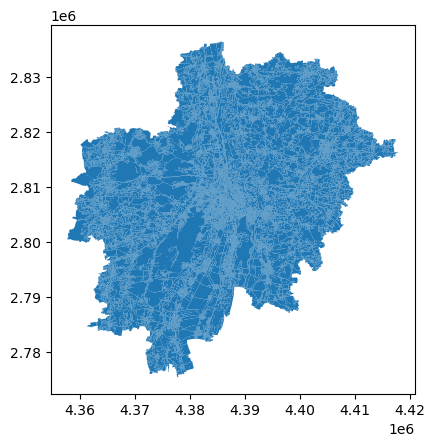

In [5]:
data.plot()

In [6]:
# create a products directory within the data dir which won't be uploaded to Github
img_dir = '../RandomForest/data_a/products2/'

# check to see if the dir it exists, if not, create it
if not os.path.exists(img_dir):
    os.makedirs(img_dir)

# filepath for image we're writing out
img_fp = img_dir + 'sentinel_bands.tif'

# Read metadata of first file and assume all other bands are the same
with rasterio.open(sentinal_band_paths[0]) as src0:
    meta = src0.meta

# Update metadata to reflect the number of layers
meta.update(count = len(sentinal_band_paths))

# # Read each layer and write it to stack
# with rasterio.open(img_fp, 'w', **meta) as dst:
#     for id, layer in enumerate(sentinal_band_paths, start=1):
#         with rasterio.open(layer) as src1:
#             dst.write_band(id, src1.read(1))

In [7]:
full_dataset = rasterio.open(img_fp)
img_rows, img_cols = full_dataset.shape
img_bands = full_dataset.count
print(full_dataset.shape) # dimensions
print(full_dataset.count) # bands

(2197, 1478)
8


In [8]:
full_dataset

<open DatasetReader name='../RandomForest/data_a/products2/sentinel_bands.tif' mode='r'>

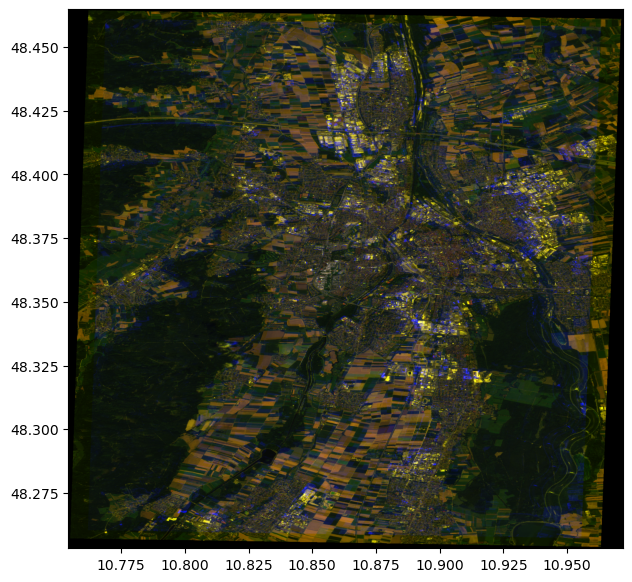

In [9]:
import numpy as np
from rasterio.plot import show
import matplotlib.pyplot as plt

img_fp = '../RandomForest/data_a/products2/sentinel_bands_proj.tif'

# Open the full extent of the raster dataset
with rasterio.open(img_fp) as dataset:
    # Read the specified bands (3, 2, 1 for RGB)
    img_data = dataset.read([3, 2, 1])
# Assuming you've already read the img_data
# Scale the data to 0-255 range, assuming it's 16-bit
img_data = np.clip(img_data / 4096 * 255, 0, 255).astype(np.uint8)

# Mask out no data values if necessary
no_data_value = -9999  # Replace with your actual no data value
img_data[img_data == no_data_value] = 0  # Set no data values to 0 for display

# Now display the image
fig, ax = plt.subplots(figsize=(10, 7))
show(img_data, ax=ax, transform=dataset.transform)

plt.show()

In [10]:
full_dataset = rasterio.open(img_fp)
raster_crs = full_dataset.crs

In [11]:
from rasterio.warp import calculate_default_transform, reproject, Resampling

# Define the source and destination coordinate reference systems
src_crs = 'EPSG:32632'
dst_crs = 'EPSG:4326'

# Open the original dataset
with rasterio.open('../RandomForest/data_a/products/sentinel_bands.tif') as src:
    # Calculate the transform and dimensions for the new dataset
    transform, width, height = calculate_default_transform(
        src.crs, dst_crs, src.width, src.height, *src.bounds)
    
    # Define the metadata for the new dataset
    kwargs = src.meta.copy()
    kwargs.update({
        'crs': dst_crs,
        'transform': transform,
        'width': width,
        'height': height
    })

    # Create the new dataset and reproject the original data into it
    with rasterio.open('../RandomForest/data_a/products/sentinel_bands_proj.tif', 'w', **kwargs) as dst:
        for i in range(1, src.count + 1):  # Loop through all bands
            reproject(
                source=rasterio.band(src, i),
                destination=rasterio.band(dst, i),
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=dst_crs,
                resampling=Resampling.nearest)

In [12]:
shapefile = gpd.read_file('C:/Users/leoni/Documents/Uni/UGS/RandomForest/data_a/landcover/Data/DE033L1_AUGSBURG_UA2018_v013.gpkg')
shapefile.crs

<Projected CRS: EPSG:3035>
Name: ETRS89-extended / LAEA Europe
Axis Info [cartesian]:
- Y[north]: Northing (metre)
- X[east]: Easting (metre)
Area of Use:
- name: Europe - European Union (EU) countries and candidates. Europe - onshore and offshore: Albania; Andorra; Austria; Belgium; Bosnia and Herzegovina; Bulgaria; Croatia; Cyprus; Czechia; Denmark; Estonia; Faroe Islands; Finland; France; Germany; Gibraltar; Greece; Hungary; Iceland; Ireland; Italy; Kosovo; Latvia; Liechtenstein; Lithuania; Luxembourg; Malta; Monaco; Montenegro; Netherlands; North Macedonia; Norway including Svalbard and Jan Mayen; Poland; Portugal including Madeira and Azores; Romania; San Marino; Serbia; Slovakia; Slovenia; Spain including Canary Islands; Sweden; Switzerland; Türkiye (Turkey); United Kingdom (UK) including Channel Islands and Isle of Man; Vatican City State.
- bounds: (-35.58, 24.6, 44.83, 84.73)
Coordinate Operation:
- name: Europe Equal Area 2001
- method: Lambert Azimuthal Equal Area
Datum: Eur

In [13]:
shapefile = shapefile.to_crs(epsg=32632)
shapefile.crs

<Projected CRS: EPSG:32632>
Name: WGS 84 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 6°E and 12°E, northern hemisphere between equator and 84°N, onshore and offshore. Algeria. Austria. Cameroon. Denmark. Equatorial Guinea. France. Gabon. Germany. Italy. Libya. Liechtenstein. Monaco. Netherlands. Niger. Nigeria. Norway. Sao Tome and Principe. Svalbard. Sweden. Switzerland. Tunisia. Vatican City State.
- bounds: (6.0, 0.0, 12.0, 84.0)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [14]:
shapefile

,country,fua_name,fua_code,code_2018,class_2018,prod_date,identifier,perimeter,area,comment,Pop2018,geometry
0,DE,Augsburg,DE033L1,11100,Continuous urban fabric (S.L. : > 80%),2020-09,425-DE033L1,155.888916,1185.135544,None,9,"MULTIPOLYGON (((640671.445 5353635.798, 640668..."
1,DE,Augsburg,DE033L1,11100,Continuous urban fabric (S.L. : > 80%),2020-09,785-DE033L1,204.742805,2617.844445,None,53,"MULTIPOLYGON (((638616.901 5358201.245, 638618..."
2,DE,Augsburg,DE033L1,11100,Continuous urban fabric (S.L. : > 80%),2020-09,751-DE033L1,397.305451,9451.982988,None,193,"MULTIPOLYGON (((642184.268 5358123.727, 642109..."
3,DE,Augsburg,DE033L1,11210,Discontinuous dense urban fabric (S.L. : 50% -...,2020-09,5156-DE033L1,2683.734912,35662.775997,None,166,"MULTIPOLYGON (((647303.556 5360566.887, 647300..."
4,DE,Augsburg,DE033L1,11100,Continuous urban fabric (S.L. : > 80%),2020-09,1986-DE033L1,297.148595,4588.045376,None,60,"MULTIPOLYGON (((642390.773 5359747.470, 642356..."
...,...,...,...,...,...,...,...,...,...,...,...,...
25378,DE,Augsburg,DE033L1,31000,Forests,2020-09,24837-DE033L1,682.883091,27090.306391,None,0,"MULTIPOLYGON (((664060.510 5368090.340, 664059..."
25379,DE,Augsburg,DE033L1,32000,Herbaceous vegetation associations (natural gr...,2020-09,25099-DE033L1,485.354917,11090.189969,None,0,"MULTIPOLYGON (((649972.813 5377568.573, 649975..."
25380,DE,Augsburg,DE033L1,32000,Herbaceous vegetation associations (natural gr...,2020-09,25134-DE033L1,528.446541,11505.819504,None,0,"MULTIPOLYGON (((649766.914 5385378.476, 649771..."
25381,DE,Augsburg,DE033L1,50000,Water,2020-09,25235-DE033L1,568.167123,10591.167983,None,0,"MULTIPOLYGON (((641260.177 5359490.598, 641256..."


In [15]:
shapefile.groupby('code_2018')['class_2018'].unique()

code_2018
11100             [Continuous urban fabric (S.L. : > 80%)]
11210    [Discontinuous dense urban fabric (S.L. : 50% ...
11220    [Discontinuous medium density urban fabric (S....
11230    [Discontinuous low density urban fabric (S.L. ...
11240    [Discontinuous very low density urban fabric (...
11300                                [Isolated structures]
12100    [Industrial, commercial, public, military and ...
12210             [Fast transit roads and associated land]
12220                    [Other roads and associated land]
12230                       [Railways and associated land]
12400                                           [Airports]
13100                  [Mineral extraction and dump sites]
13300                                 [Construction sites]
13400                           [Land without current use]
14100                                  [Green urban areas]
14200                      [Sports and leisure facilities]
21000                         [Arable land (an

In [16]:
shapefile = shapefile.to_crs({'init': 'epsg:4326'})
shapefile.crs

c:\Users\leoni\Programme\Miniconda\envs\geo\Lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


<Geographic 2D CRS: +init=epsg:4326 +type=crs>
Name: WGS 84
Axis Info [ellipsoidal]:
- lon[east]: Longitude (degree)
- lat[north]: Latitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [17]:
len(shapefile)

25383

In [18]:
# this generates a list of shapely geometries
geoms = shapefile.geometry.values 

# let's grab a single shapely geometry to check
geometry = geoms[0] 
print(type(geometry))
print(geometry)

# transform to GeoJSON format
from shapely.geometry import mapping
feature = [mapping(geometry)] # can also do this using polygon.__geo_interface__
print(type(feature))
print(feature)

<class 'shapely.geometry.multipolygon.MultiPolygon'>
MULTIPOLYGON (((10.897603435546376 48.32024993125257, 10.897558639391013 48.32006889000404, 10.896796603606004 48.32015034274349, 10.896843224431512 48.32033682294202, 10.897603435546376 48.32024993125257)))
<class 'list'>
[{'type': 'MultiPolygon', 'coordinates': [(((10.897603435546376, 48.32024993125257), (10.897558639391013, 48.32006889000404), (10.896796603606004, 48.32015034274349), (10.896843224431512, 48.32033682294202), (10.897603435546376, 48.32024993125257)),)]}]


In [19]:
out_image, out_transform = mask(full_dataset, feature, crop=True)
out_image.shape

(8, 3, 8)

In [20]:
full_dataset.close()

In [21]:
import geopandas as gpd
import rasterio
from rasterio.mask import mask
from shapely.geometry import mapping
from shapely.geometry import box


# Load the shapefile
#shapefile = gpd.read_file(shapefile_path)

# Check if the CRS matches, if not, reproject
if shapefile.crs != raster_crs:
    shapefile = shapefile.to_crs(raster_crs)

# Check that geometries are valid
shapefile['valid'] = shapefile.is_valid
shapefile = shapefile[shapefile['valid']]


with rasterio.open('../RandomForest/data_a/products/sentinel_bands_proj.tif') as src:
    raster_bounds = src.bounds
    raster_bbox = box(*raster_bounds)  # Create a bounding box from the raster bounds

    # Only proceed if the raster and shapefile overlap
    if not shapefile.unary_union.intersects(raster_bbox):
        raise ValueError("Shapefile and raster do not overlap")
    else:
        print("The shapefile and raster overlap.")

    # Extract the raster values within the polygon
    for geom in shapefile.geometry:
        feature = [mapping(geom)]
        out_image, out_transform = mask(src, feature, crop=True)
        # process out_image

The shapefile and raster overlap.


ValueError: Input shapes do not overlap raster.

### Adjust Landcover Data to match the scene

In [22]:
# Reproject the shapefile to match the raster's CRS
shapefile = shapefile.to_crs(epsg=32632)

In [23]:
with rasterio.open('../RandomForest/data_a/products/sentinel_bands_proj.tif') as src:
    print(src.bounds)
print(shapefile.total_bounds)

BoundingBox(left=10.7543531803083, bottom=48.25329694782757, right=10.97190533912122, top=48.46476914285253)
[ 610820.72860213 5327718.5402929   670858.48189483 5388978.22555986]


In [24]:
shapefile = shapefile.to_crs("EPSG:4326")
print(shapefile.total_bounds)

[10.494824  48.0892135 11.3108095 48.6385815]


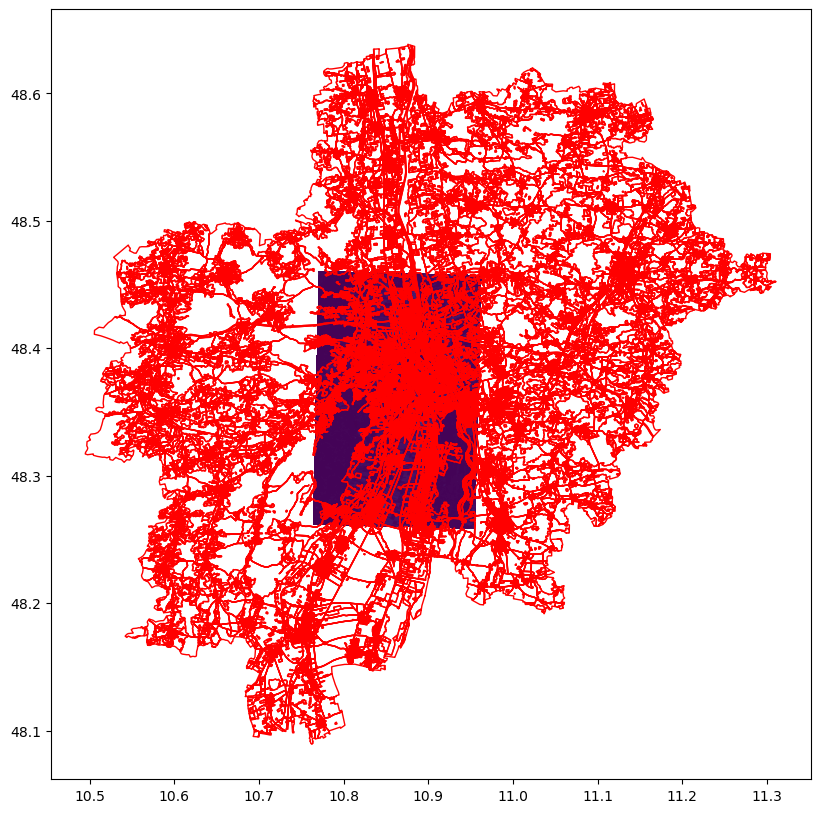

In [25]:
import matplotlib.pyplot as plt
import rasterio
import rasterio.plot

fig, ax = plt.subplots(figsize=(10, 10))
with rasterio.open('../RandomForest/data_a/products/sentinel_bands_proj.tif') as src:
    rasterio.plot.show(src, ax=ax)
shapefile.plot(ax=ax, facecolor='none', edgecolor='red')
plt.show()

In [26]:
from shapely.geometry import box
from shapely.affinity import scale

shapefile_path = 'C:/Users/leoni/Documents/Uni/UGS/RandomForest/data_a/landcover/Data/DE033L1_AUGSBURG_UA2018_v013.gpkg'

# Open the raster file and get its bounds
with rasterio.open('../RandomForest/data_a/products/sentinel_bands_proj.tif') as src:
    bounds = src.bounds

# Create a slightly smaller bounding box geometry from the raster bounds
# Reduce each side of the bounding box by a small fraction, e.g., 0.99 to reduce by 1%
smaller_bbox = scale(box(bounds.left, bounds.bottom, bounds.right, bounds.top), xfact=0.99, yfact=0.99, origin='center')

# Create a GeoDataFrame from the smaller bounding box
smaller_bbox_gdf = gpd.GeoDataFrame({'geometry': [smaller_bbox]}, crs=src.crs)

# Load the shapefile
shapefile = gpd.read_file(shapefile_path)

# Make sure the shapefile is in the same CRS as the raster
shapefile = shapefile.to_crs(src.crs)

# Perform a spatial join to find features completely within the smaller bounding box
within_shapefile = gpd.sjoin(shapefile, smaller_bbox_gdf, op='within')

# Save the clipped shapefile to a new file
within_shapefile.to_file('within_shapefile_smaller_bbox.gpkg', driver='GPKG')

c:\Users\leoni\Programme\Miniconda\envs\geo\Lib\site-packages\IPython\core\interactiveshell.py:3466: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


In [27]:
within_shapefile = within_shapefile.groupby('class_2018', group_keys=False).apply(lambda x: x.sample(n=10, replace=True))
within_shapefile

,country,fua_name,fua_code,code_2018,class_2018,prod_date,identifier,perimeter,area,comment,Pop2018,geometry,index_right
15079,DE,Augsburg,DE033L1,12400,Airports,2020-09,15062-DE033L1,5540.286317,1.073691e+06,None,0,"MULTIPOLYGON (((10.92006 48.41900, 10.92004 48...",0
15079,DE,Augsburg,DE033L1,12400,Airports,2020-09,15062-DE033L1,5540.286317,1.073691e+06,None,0,"MULTIPOLYGON (((10.92006 48.41900, 10.92004 48...",0
15079,DE,Augsburg,DE033L1,12400,Airports,2020-09,15062-DE033L1,5540.286317,1.073691e+06,None,0,"MULTIPOLYGON (((10.92006 48.41900, 10.92004 48...",0
15079,DE,Augsburg,DE033L1,12400,Airports,2020-09,15062-DE033L1,5540.286317,1.073691e+06,None,0,"MULTIPOLYGON (((10.92006 48.41900, 10.92004 48...",0
15079,DE,Augsburg,DE033L1,12400,Airports,2020-09,15062-DE033L1,5540.286317,1.073691e+06,None,0,"MULTIPOLYGON (((10.92006 48.41900, 10.92004 48...",0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
24752,DE,Augsburg,DE033L1,50000,Water,2020-09,25377-DE033L1,1031.390030,8.871434e+03,None,0,"MULTIPOLYGON (((10.89182 48.38324, 10.89167 48...",0
22694,DE,Augsburg,DE033L1,50000,Water,2020-09,25233-DE033L1,1999.374375,5.640709e+04,None,0,"MULTIPOLYGON (((10.91340 48.37593, 10.91341 48...",0
22569,DE,Augsburg,DE033L1,50000,Water,2020-09,25229-DE033L1,467.600086,3.681042e+03,None,0,"MULTIPOLYGON (((10.92455 48.36257, 10.92433 48...",0
24651,DE,Augsburg,DE033L1,50000,Water,2020-09,25250-DE033L1,761.312022,1.079398e+04,None,0,"MULTIPOLYGON (((10.92874 48.35514, 10.92901 48...",0


In [28]:
within_shapefile.explore()

In [29]:
import geopandas as gpd
import rasterio
from rasterio.mask import mask
from shapely.geometry import mapping
from shapely.geometry import box


# Load the shapefile
#shapefile = gpd.read_file(shapefile_path)
shapefile = within_shapefile

# Check if the CRS matches, if not, reproject
if shapefile.crs != raster_crs:
    shapefile = shapefile.to_crs(raster_crs)

# Check that geometries are valid
shapefile['valid'] = shapefile.is_valid
shapefile = shapefile[shapefile['valid']]


with rasterio.open('../RandomForest/data_a/products/sentinel_bands_proj.tif') as src:
    raster_bounds = src.bounds
    raster_bbox = box(*raster_bounds)  # Create a bounding box from the raster bounds

    # Only proceed if the raster and shapefile overlap
    if not shapefile.unary_union.intersects(raster_bbox):
        raise ValueError("Shapefile and raster do not overlap")
    else:
        print("The shapefile and raster overlap.")

    # Extract the raster values within the polygon
    for geom in shapefile.geometry:
        feature = [mapping(geom)]
        out_image, out_transform = mask(src, feature, crop=True)
        # process out_image

The shapefile and raster overlap.


In [30]:
import numpy as np

# Initialize a list to hold the mean values for each band
band_means = []

# Extract the raster values within the polygon
for geom in shapefile.geometry:
    feature = [mapping(geom)]
    
    with rasterio.open('../RandomForest/data_a/products/sentinel_bands_proj.tif') as src:
        out_image, out_transform = mask(src, feature, crop=True)
        
        # Calculate mean of each band, excluding no-data values
        means = np.ma.array(out_image, mask=out_image == src.nodata).mean(axis=(1, 2))
        band_means.append(means.filled(src.nodata))

In [31]:
with rasterio.open('../RandomForest/data_a/products/sentinel_bands_proj.tif') as src:
    raster_crs = src.crs
shapefile_crs = shapefile.crs

print("Raster CRS: ", raster_crs)
print("Shapefile CRS: ", shapefile_crs)

Raster CRS:  EPSG:4326
Shapefile CRS:  GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AXIS["Latitude",NORTH],AXIS["Longitude",EAST],AUTHORITY["EPSG","4326"]]


In [32]:
with rasterio.open('../RandomForest/data_a/products/sentinel_bands_proj.tif') as src:
    raster_bounds = src.bounds

# Use the total_bounds attribute of the shapefile to get its bounding coordinates
shapefile_bounds = shapefile.total_bounds

print("Raster bounds: ", raster_bounds)
print("Shapefile bounds: ", shapefile_bounds)

Raster bounds:  BoundingBox(left=10.7543531803083, bottom=48.25329694782757, right=10.97190533912122, top=48.46476914285253)
Shapefile bounds:  [10.75825316 48.25462099 10.97000552 48.46369112]


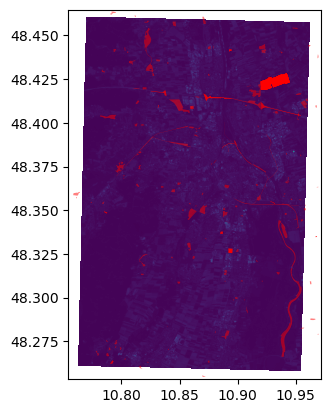

In [33]:
import matplotlib.pyplot as plt
import rasterio
import rasterio.plot

# Open the raster file
with rasterio.open('../RandomForest/data_a/products/sentinel_bands_proj.tif') as src:
    # Plot the raster
    fig, ax = plt.subplots()
    rasterio.plot.show(src, ax=ax)
    # Overlay the shapefile
    shapefile.plot(ax=ax, color='red', alpha=0.5)
    plt.show()

In [34]:
import numpy as np
import rasterio
from rasterio.mask import mask
from shapely.geometry import mapping
import geopandas as gpd
from rasterio.features import geometry_mask

img_fp = '../RandomForest/data_a/products/sentinel_bands_proj.tif'

X = np.array([], dtype=np.float32).reshape(0, 8)  # Replace '8' with the actual number of bands if different
y = []  # Initialize y as an empty list

incomplete_features = []

with rasterio.open(img_fp) as src:
    raster_crs = src.crs
    nodata = src.nodatavals[0]  # Assuming all bands have the same nodata value
    band_count = src.count

    # Iterate over the geometries in the shapefile
    for index, row in shapefile.iterrows():
        geom = row['geometry']
        # Create a mask for the current geometry
        geom_mask = geometry_mask([geom], transform=src.transform, invert=True, out_shape=(src.height, src.width))

        # Check if the geometry intersects with the raster
        if not geom_mask.all():
            out_image, out_transform = mask(src, [geom], crop=True, nodata=nodata)
            out_image_masked = np.ma.masked_equal(out_image, nodata)
            valid_data = out_image_masked.compressed()

            # Ensure we have a complete set of pixels for all bands
            if valid_data.size % band_count == 0:
                out_image_reshaped = valid_data.reshape(-1, band_count)

                # Remove rows that contain nodata values
                valid_rows = np.all(out_image_reshaped != nodata, axis=1)
                out_image_reshaped = out_image_reshaped[valid_rows]

                # Only proceed if we have valid data left after removing nodata rows
                if out_image_reshaped.size > 0:
                    X = np.vstack((X, out_image_reshaped))
                    y.extend([row['class_2018']] * out_image_reshaped.shape[0])
            else:
                # Collect indices of incomplete features to handle later
                incomplete_features.append(index)
                print(f"Feature {index} does not have a complete set of pixels.")

# Handle incomplete features as needed
# For example, you might want to drop them from the shapefile
shapefile = shapefile.drop(incomplete_features)

Feature 17009 does not have a complete set of pixels.
Feature 2793 does not have a complete set of pixels.
Feature 19574 does not have a complete set of pixels.
Feature 5847 does not have a complete set of pixels.
Feature 15784 does not have a complete set of pixels.
Feature 24478 does not have a complete set of pixels.
Feature 14205 does not have a complete set of pixels.
Feature 14205 does not have a complete set of pixels.
Feature 15265 does not have a complete set of pixels.
Feature 22416 does not have a complete set of pixels.
Feature 20374 does not have a complete set of pixels.


In [35]:
print(shapefile)

      country  fua_name fua_code code_2018 class_2018 prod_date  \
15079      DE  Augsburg  DE033L1     12400   Airports   2020-09   
15079      DE  Augsburg  DE033L1     12400   Airports   2020-09   
15079      DE  Augsburg  DE033L1     12400   Airports   2020-09   
15079      DE  Augsburg  DE033L1     12400   Airports   2020-09   
15079      DE  Augsburg  DE033L1     12400   Airports   2020-09   
...       ...       ...      ...       ...        ...       ...   
24752      DE  Augsburg  DE033L1     50000      Water   2020-09   
22694      DE  Augsburg  DE033L1     50000      Water   2020-09   
22569      DE  Augsburg  DE033L1     50000      Water   2020-09   
24651      DE  Augsburg  DE033L1     50000      Water   2020-09   
24672      DE  Augsburg  DE033L1     50000      Water   2020-09   

          identifier    perimeter          area comment  Pop2018  \
15079  15062-DE033L1  5540.286317  1.073691e+06    None        0   
15079  15062-DE033L1  5540.286317  1.073691e+06    None    

In [36]:
# Initialize empty arrays for the pixel values and labels
X = np.array([], dtype=np.float32).reshape(0, 8)  # Replace '8' with the number of bands
y = []

with rasterio.open(img_fp) as src:
    # Ensure the shapefile is in the same CRS as the raster
    shapefile = shapefile.to_crs(src.crs)
    nodata = src.nodatavals[0]  # Assuming all bands have the same nodata value

    # Loop through each feature in the shapefile
    for index, row in shapefile.iterrows():
        geom = row.geometry
        # Mask the raster with the geometry
        out_image, out_transform = mask(src, [geom], crop=True, nodata=nodata, filled=False)

        # Check if there is any valid data
        if np.any(out_image.mask == False):
            # Reshape and append to X and y
            valid_pixels = out_image.data[~out_image.mask].reshape(-1, src.count)
            X = np.vstack((X, valid_pixels))
            y.extend([row['class_2018']] * valid_pixels.shape[0])

In [37]:
out_image

masked_array(
  data=[[[--, --, --, ..., --, --, --],
         [--, --, --, ..., 914.0, 847.0, 981.0],
         [--, --, --, ..., 959.0, 922.0, 922.0],
         ...,
         [--, --, --, ..., 991.0, 965.0, --],
         [--, --, --, ..., 896.0, --, --],
         [--, --, --, ..., --, --, --]],

        [[--, --, --, ..., --, --, --],
         [--, --, --, ..., 1200.0, 1180.0, 1240.0],
         [--, --, --, ..., 1246.0, 1184.0, 1236.0],
         ...,
         [--, --, --, ..., 465.0, 448.0, --],
         [--, --, --, ..., 549.0, --, --],
         [--, --, --, ..., --, --, --]],

        [[--, --, --, ..., --, --, --],
         [--, --, --, ..., 1654.0, 1648.0, 1698.0],
         [--, --, --, ..., 1766.0, 1784.0, 1818.0],
         ...,
         [--, --, --, ..., 290.0, 261.0, --],
         [--, --, --, ..., 319.0, --, --],
         [--, --, --, ..., --, --, --]],

        ...,

        [[--, --, --, ..., --, --, --],
         [--, --, --, ..., 2546.125, 2541.375, 2559.0625],
         [--

In [38]:
# Assuming 'shapefile' is a GeoDataFrame that has been properly read and is in the correct CRS
geoms = shapefile.geometry.values  # This will give us a numpy array of geometry objects

X = np.array([], dtype=np.float32).reshape(0, band_count)  # Adjust dtype and band_count as needed
y = []

with rasterio.open(img_fp) as src:
    for geom in geoms:  # Loop through each geometry in the array
        feature = [mapping(geom)]  # Convert to format expected by rasterio.mask.mask

        out_image, out_transform = mask(src, feature, crop=True)
        
        # Check for pixels that are not nodata (neither 0 nor 255 in all bands)
        if out_image.any():  # If there's any non-nodata pixel
            # Filter out the nodata pixels and reshape
            out_image_reshaped = out_image[:, (out_image[0] != nodata) & (out_image[0] != 0) & (out_image[0] != 255)].reshape(-1, band_count)
            
            # Now, we need to get the corresponding class for each geometry
            class_label = shapefile.loc[shapefile.geometry == geom, 'class_2018'].values[0]
            
            # Extend the X and y arrays
            X = np.vstack((X, out_image_reshaped))  # Stack the pixels
            y.extend([class_label] * out_image_reshaped.shape[0])  # Extend the labels

In [39]:
# What are our classification labels?
labels = np.unique(shapefile["class_2018"])
print('The training data include {n} classes: {classes}\n'.format(n=labels.size, 
                                                                classes=labels))

# We will need a "X" matrix containing our features, and a "y" array containing our labels
print('Our X matrix is sized: {sz}'.format(sz=X.shape))
print('Our y array is sized: {sz}'.format(sz=np.array(y).shape))

The training data include 21 classes: ['Airports' 'Arable land (annual crops)' 'Construction sites'
 'Continuous urban fabric (S.L. : > 80%)'
 'Discontinuous dense urban fabric (S.L. : 50% -  80%)'
 'Discontinuous low density urban fabric (S.L. : 10% - 30%)'
 'Discontinuous medium density urban fabric (S.L. : 30% - 50%)'
 'Discontinuous very low density urban fabric (S.L. : < 10%)'
 'Fast transit roads and associated land' 'Forests' 'Green urban areas'
 'Herbaceous vegetation associations (natural grassland, moors...)'
 'Industrial, commercial, public, military and private units'
 'Isolated structures' 'Land without current use'
 'Mineral extraction and dump sites' 'Other roads and associated land'
 'Pastures' 'Railways and associated land' 'Sports and leisure facilities'
 'Water']

Our X matrix is sized: (179892, 8)
Our y array is sized: (179892,)


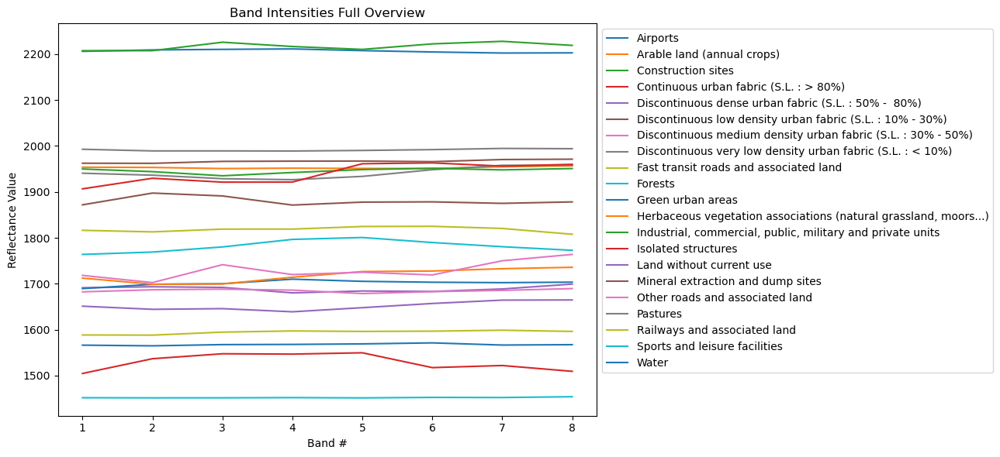

In [40]:
fig, ax = plt.subplots(figsize=[13, 6])

# Numbers 1-8 for bands
band_count = np.arange(1, 9)

# Convert y to numpy array for indexing
y_array = np.array(y)

# Iterate over unique classes
classes = np.unique(y_array)
for class_type in classes:
    # Calculate mean reflectance value for each band for the current class
    band_intensity = np.mean(X[y_array == class_type, :], axis=0)

    # Plot the mean reflectance values on the single plot
    ax.plot(band_count, band_intensity, label=class_type)

# Add axis labels
ax.set_xlabel('Band #')
ax.set_ylabel('Reflectance Value')

# Add a title
ax.set_title('Band Intensities Full Overview')

# Add legend outside of the plot
ax.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Adjust layout to accommodate the legend
plt.tight_layout()

# Display the plot
plt.show()

code_2018<br>
11100             [Continuous urban fabric (S.L. : > 80%)]<br>
11210    [Discontinuous dense urban fabric (S.L. : 50% ...<br>
11220    [Discontinuous medium density urban fabric (S....<br>
11230    [Discontinuous low density urban fabric (S.L. ...<br>
11240    [Discontinuous very low density urban fabric (...<br>
11300                                [Isolated structures]<br>
12100    [Industrial, commercial, public, military and ...<br>
12210             [Fast transit roads and associated land]<br>
12220                    [Other roads and associated land]<br>
12230                       [Railways and associated land]<br>
12400                                           [Airports]<br>
13100                  [Mineral extraction and dump sites]<br>
13300                                 [Construction sites]<br>
13400                           [Land without current use]<br>
14100                                  [Green urban areas]<br>
14200                      [Sports and leisure facilities]<br>
21000                         [Arable land (annual crops)]<br>
23000                                           [Pastures]<br>
31000                                            [Forests]<br>
32000    [Herbaceous vegetation associations (natural g...<br>
50000                                              [Water]<br>
Name: class_2018, dtype: object<br>

The training data include 21 classes: [ <br>
'Airports' <br>
'Arable land (annual crops)' <br>
'Construction sites' <br>
'Continuous urban fabric (S.L. : > 80%)' <br>
'Discontinuous dense urban fabric (S.L. : 50% -  80%)' <br>
'Discontinuous low density urban fabric (S.L. : 10% - 30%)' <br>
'Discontinuous medium density urban fabric (S.L. : 30% - 50%)' <br>
'Discontinuous very low density urban fabric (S.L. : < 10%)' <br>
'Fast transit roads and associated land' <br>
'Forests' <br>
'Green urban areas' <br>
'Herbaceous vegetation associations (natural grassland, moors...)' <br>
'Industrial, commercial, public, military and private units' <br>
'Isolated structures' <br>
'Land without current use' <br>
'Mineral extraction and dump sites' <br>
'Other roads and associated land' <br>
'Pastures' <br>
'Railways and associated land' <br>
'Sports and leisure facilities'<br>
'Water']<br>

In [41]:
def str_class_to_int(class_array):
    class_array[class_array == 'Airports'] = 0
    class_array[class_array == 'Arable land (annual crops)'] = 1
    class_array[class_array == 'Construction sites'] = 2
    class_array[class_array == 'Continuous urban fabric (S.L. : > 80%)'] = 3
    class_array[class_array == 'Discontinuous dense urban fabric (S.L. : 50% -  80%)'] = 4
    class_array[class_array == 'Discontinuous low density urban fabric (S.L. : 10% - 30%)'] = 5
    class_array[class_array == 'Discontinuous medium density urban fabric (S.L. : 30% - 50%)'] = 6
    class_array[class_array == 'Discontinuous very low density urban fabric (S.L. : < 10%)'] = 7
    class_array[class_array == 'Fast transit roads and associated land'] = 8
    class_array[class_array == 'Forests'] = 9
    class_array[class_array == 'Green urban areas'] = 10
    class_array[class_array == 'Herbaceous vegetation associations (natural grassland, moors...)'] = 11
    class_array[class_array == 'Industrial, commercial, public, military and private units'] = 12
    class_array[class_array == 'Isolated structures'] = 13
    class_array[class_array == 'Land without current use'] = 14
    class_array[class_array == 'Mineral extraction and dump sites'] = 15
    class_array[class_array == 'Other roads and associated land'] = 16
    class_array[class_array == 'Pastures'] = 17
    class_array[class_array == 'Railways and associated land'] = 18
    class_array[class_array == 'Sports and leisure facilities'] = 19
    class_array[class_array == 'Water'] = 20
    return(class_array.astype(int))

## GaussianNB Naive Bayes

In [44]:
from sklearn.naive_bayes import GaussianNB

gnb = GaussianNB()
gnb.fit(X, y)

GaussianNB()

In [45]:
from rasterio.plot import show
from rasterio.plot import show_hist
from rasterio.windows import Window
from rasterio.plot import reshape_as_raster, reshape_as_image

Number of Bands: 8 <br>
Height: 450 pixels <br>
Width: 1150 pixels <br>
(8, 450, 1150) <br>
(450, 1150, 8) <br>

[:, 150:600, 250:1400] slices the array: <br>
The : means all bands are included. <br>
150:600 slices the rows (height) of the image. <br>
250:1400 slices the columns (width) of the image. <br>

```python
img_data = src.read()

# Select specific bands (7, 3, 2) and the desired row and column ranges
# Adjust indices by subtracting 1 from the band number
selected_bands_img = img_data[[6, 2, 1], 150:600, 250:1400]

# Now, selected_bands_img.shape will give you the dimensions (number_of_selected_bands, height, width)
num_selected_bands, height, width = selected_bands_img.shape
```

In [46]:
with rasterio.open(img_fp) as src:
    # may need to reduce this image size if your kernel crashes, takes a lot of memory
    img = src.read()[:, 400:950, 450:1500]

# Take our full image and reshape into long 2d array (nrow * ncol, nband) for classification
print(img.shape)
reshaped_img = reshape_as_image(img)
print(reshaped_img.shape)

(8, 550, 1050)
(550, 1050, 8)


In [47]:
class_prediction = gnb.predict(reshaped_img.reshape(-1, 8))

# Reshape our classification map back into a 2D matrix so we can visualize it
class_prediction = class_prediction.reshape(reshaped_img[:, :, 0].shape)

In [48]:
class_prediction = str_class_to_int(class_prediction)

In [49]:
def color_stretch(image, index):
    colors = image[:, :, index].astype(np.float64)
    for b in range(colors.shape[2]):
        colors[:, :, b] = rasterio.plot.adjust_band(colors[:, :, b])
    return colors
    
# find the highest pixel value in the prediction image
n = int(np.max(class_prediction))

# next setup a colormap for our map
colors = dict((
    (0, (255, 215, 0, 255)),    # Airports - Gold
    (1, (34, 139, 34, 255)),    # Arable Land - Forest Green
    (2, (255, 69, 0, 255)),     # Construction - Orange Red
    (3, (220, 20, 60, 255)),    # Continuous Urban Fabric - Crimson
    (4, (0, 191, 255, 255)),    # Discontinuous Dense Urban Fabric - Deep Sky Blue
    (5, (148, 0, 211, 255)),    # Discontinuous Low Density Urban Fabric - Dark Violet
    (6, (255, 140, 0, 255)),    # Discontinuous Medium Density Urban Fabric - Dark Orange
    (7, (32, 178, 170, 255)),   # Discontinuous Very Low Density Urban Fabric - Light Sea Green
    (8, (128, 0, 128, 255)),    # Fast Transit Roads and Associated Land - Purple
    (9, (34, 139, 34, 255)),    # Forests - Forest Green
    (10, (107, 142, 35, 255)),  # Green Urban Areas - Olive Drab
    (11, (154, 205, 50, 255)),  # Herbaceous Vegetation Associations - Yellow Green
    (12, (178, 34, 34, 255)),   # Industrial, Commercial, Public, Military and Private Units - Firebrick
    (13, (189, 183, 107, 255)), # Isolated Structures - Dark Khaki
    (14, (0, 128, 128, 255)),   # Land without Current Use - Teal
    (15, (165, 42, 42, 255)),   # Mineral Extraction and Dump Sites - Brown
    (16, (85, 107, 47, 255)),   # Other Roads and Associated Land - Dark Olive Green
    (17, (255, 99, 71, 255)),   # Pastures - Tomato
    (18, (0, 0, 128, 255)),     # Railways and Associated Land - Navy
    (19, (72, 61, 139, 255)),   # Sports and Leisure Facilities - Dark Slate Blue
    (20, (70, 130, 180, 255)),  # Water - Steel Blue
))

# Put 0 - 255 as float 0 - 1
for k in colors:
    v = colors[k]
    _v = [_v / 255.0 for _v in v]
    colors[k] = _v
    
index_colors = [colors[key] if key in colors else 
                (255, 255, 255, 0) for key in range(0, n+1)]

cmap = plt.matplotlib.colors.ListedColormap(index_colors, 'Classification', n+1)

C:\Users\leoni\AppData\Local\Temp\ipykernel_4240\2740226285.py:39: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


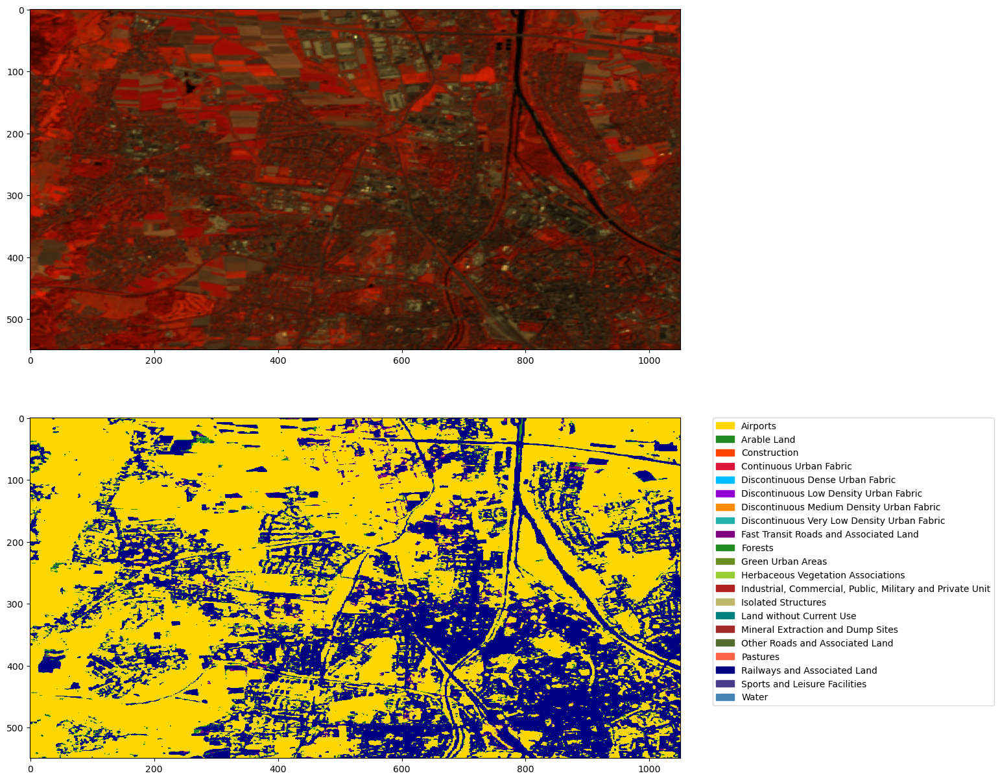

In [50]:
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap

# Define the class labels and their corresponding colors
class_labels = {
    0: "Airports",
    1: "Arable Land",
    2: "Construction",
    3: "Continuous Urban Fabric",
    4: "Discontinuous Dense Urban Fabric",
    5: "Discontinuous Low Density Urban Fabric",
    6: "Discontinuous Medium Density Urban Fabric",
    7: "Discontinuous Very Low Density Urban Fabric",
    8: "Fast Transit Roads and Associated Land",
    9: "Forests",
    10: "Green Urban Areas",
    11: "Herbaceous Vegetation Associations",
    12: "Industrial, Commercial, Public, Military and Private Unit",
    13: "Isolated Structures",
    14: "Land without Current Use",
    15: "Mineral Extraction and Dump Sites",
    16: "Other Roads and Associated Land",
    17: "Pastures",
    18: "Railways and Associated Land",
    19: "Sports and Leisure Facilities",
    20: "Water",
}

patches = [mpatches.Patch(color=colors[key], label=class_labels[key]) for key in class_labels]

fig, axs = plt.subplots(2,1,figsize=(20,15))

img_stretched = color_stretch(reshaped_img, [7, 3, 2])
axs[0].imshow(img_stretched)

axs[1].imshow(class_prediction, cmap=cmap, interpolation='none')
axs[1].legend(handles=patches, loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

fig.show()

In [51]:
with rasterio.open(img_fp) as src:
    green_band = src.read(3)
    red_band = src.read(4)
    nir_band = src.read(8)
    
ndwi = (green_band.astype(float) - nir_band.astype(float)) / (green_band.astype(float) + nir_band.astype(float))
ndvi = (nir_band.astype(float) - red_band.astype(float)) / (red_band.astype(float) + nir_band.astype(float))

In [52]:
ndwi = ndwi[150:600, 250:1400]
ndvi = ndvi[150:600, 250:1400]

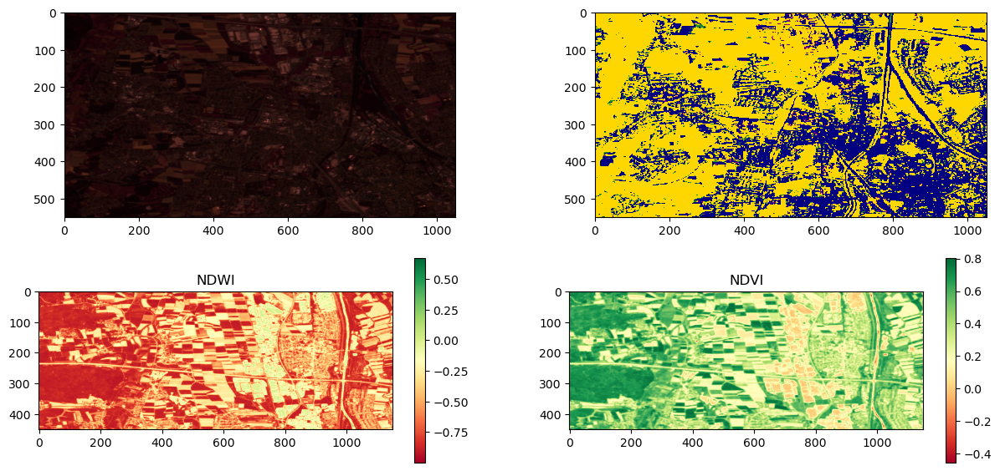

In [53]:
fig, axs = plt.subplots(2,2,figsize=(15,7))

img_stretched = color_stretch(reshaped_img, [3, 2, 1])
axs[0,0].imshow(img_stretched)

axs[0,1].imshow(class_prediction, cmap=cmap, interpolation='none')

nwdi_plot = axs[1,0].imshow(ndwi, cmap="RdYlGn")
axs[1,0].set_title("NDWI")
fig.colorbar(nwdi_plot, ax=axs[1,0])

ndvi_plot = axs[1,1].imshow(ndvi, cmap="RdYlGn")
axs[1,1].set_title("NDVI")
fig.colorbar(ndvi_plot, ax=axs[1,1])

plt.show()

C:\Users\leoni\AppData\Local\Temp\ipykernel_4240\1670099218.py:8: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


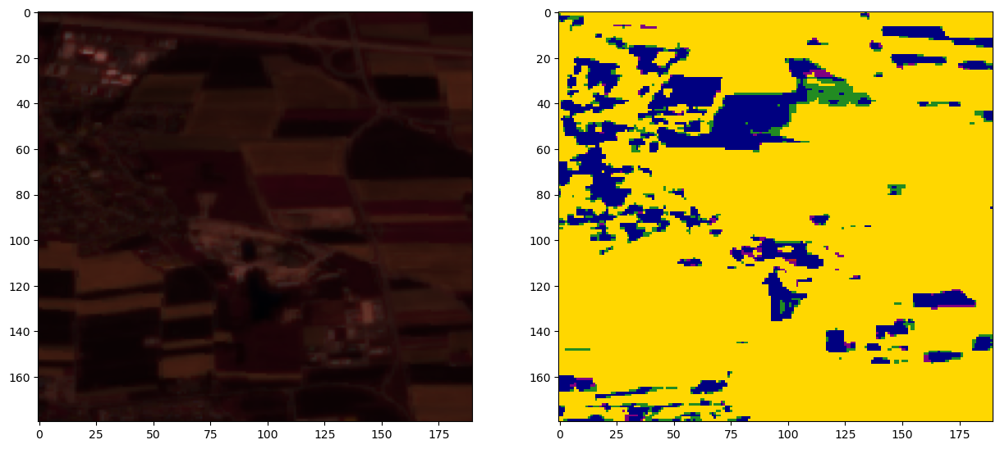

In [54]:
fig, axs = plt.subplots(1,2,figsize=(15,15))

img_stretched = color_stretch(reshaped_img, [3, 2, 1])
axs[0].imshow(img_stretched[0:180, 160:350])

axs[1].imshow(class_prediction[0:180, 160:350], cmap=cmap, interpolation='none')

fig.show()

## Random Forest

In [55]:
from sklearn.ensemble import RandomForestClassifier
import numpy as np
import rasterio
import matplotlib.pyplot as plt

# Create the Random Forest model
rf = RandomForestClassifier()

# Train the model
rf.fit(X, y)

RandomForestClassifier()

In [114]:
with rasterio.open(img_fp) as src:
    img = src.read()[:, 400:950, 450:1500]
reshaped_img = reshape_as_image(img)

# Predict the classes using the Random Forest model
class_prediction = rf.predict(reshaped_img.reshape(-1, 8))

# Reshape the classification map for visualization
class_prediction = str_class_to_int(class_prediction) 

In [115]:
def color_stretch(image, index):
    colors = image[:, :, index].astype(np.float64)
    for b in range(colors.shape[2]):
        colors[:, :, b] = rasterio.plot.adjust_band(colors[:, :, b])
    return colors
    
# find the highest pixel value in the prediction image
n = int(np.max(class_prediction))

# next setup a colormap for our map
colors = dict((
    (0, (255, 215, 0, 255)),    # Airports - Gold
    (1, (34, 139, 34, 255)),    # Arable Land - Forest Green
    (2, (255, 69, 0, 255)),     # Construction - Orange Red
    (3, (220, 20, 60, 255)),    # Continuous Urban Fabric - Crimson
    (4, (0, 191, 255, 255)),    # Discontinuous Dense Urban Fabric - Deep Sky Blue
    (5, (148, 0, 211, 255)),    # Discontinuous Low Density Urban Fabric - Dark Violet
    (6, (255, 140, 0, 255)),    # Discontinuous Medium Density Urban Fabric - Dark Orange
    (7, (32, 178, 170, 255)),   # Discontinuous Very Low Density Urban Fabric - Light Sea Green
    (8, (128, 0, 128, 255)),    # Fast Transit Roads and Associated Land - Purple
    (9, (34, 139, 34, 255)),    # Forests - Forest Green
    (10, (107, 142, 35, 255)),  # Green Urban Areas - Olive Drab
    (11, (154, 205, 50, 255)),  # Herbaceous Vegetation Associations - Yellow Green
    (12, (178, 34, 34, 255)),   # Industrial, Commercial, Public, Military and Private Units - Firebrick
    (13, (189, 183, 107, 255)), # Isolated Structures - Dark Khaki
    (14, (0, 128, 128, 255)),   # Land without Current Use - Teal
    (15, (165, 42, 42, 255)),   # Mineral Extraction and Dump Sites - Brown
    (16, (85, 107, 47, 255)),   # Other Roads and Associated Land - Dark Olive Green
    (17, (255, 99, 71, 255)),   # Pastures - Tomato
    (18, (0, 0, 128, 255)),     # Railways and Associated Land - Navy
    (19, (72, 61, 139, 255)),   # Sports and Leisure Facilities - Dark Slate Blue
    (20, (70, 130, 180, 255)),  # Water - Steel Blue
))

# Put 0 - 255 as float 0 - 1
for k in colors:
    v = colors[k]
    _v = [_v / 255.0 for _v in v]
    colors[k] = _v
    
index_colors = [colors[key] if key in colors else 
                (255, 255, 255, 0) for key in range(0, n+1)]

cmap = plt.matplotlib.colors.ListedColormap(index_colors, 'Classification', n+1)

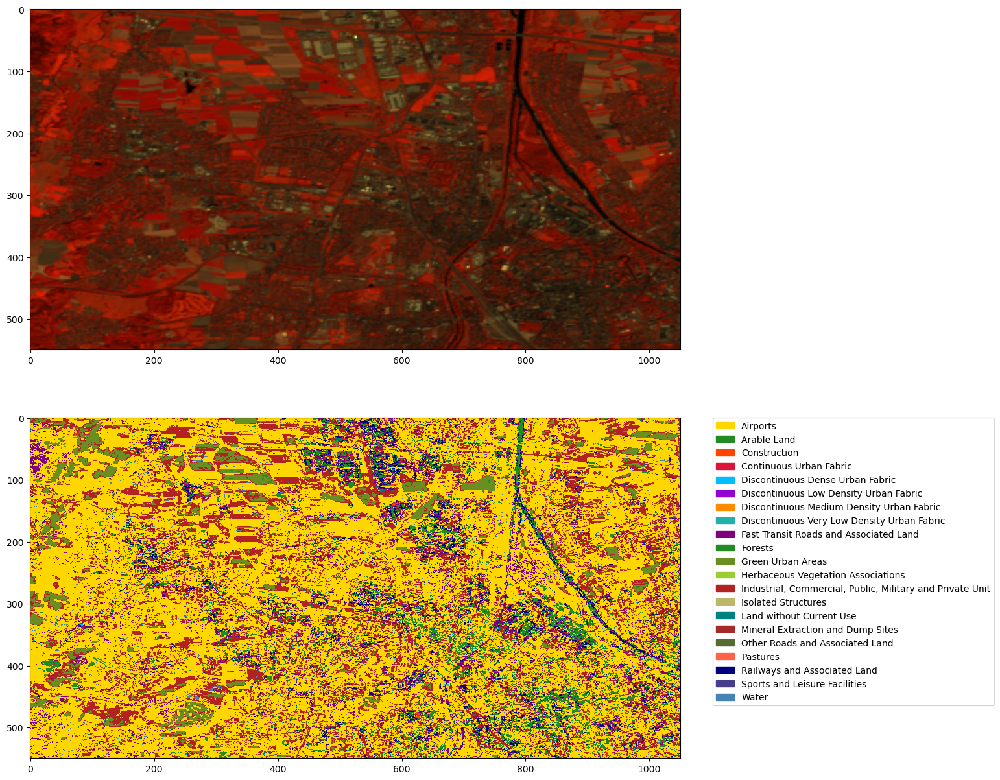

In [116]:
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap

# Assuming reshaped_img is in the correct format
expected_shape = reshaped_img[:, :, 0].shape
class_prediction_2d = class_prediction.reshape(expected_shape)

fig, axs = plt.subplots(2, 1, figsize=(20, 15))

img_stretched = color_stretch(reshaped_img, [7, 3, 2])
axs[0].imshow(img_stretched)

# Use the reshaped 2D array for visualization
axs[1].imshow(class_prediction_2d, cmap=cmap, interpolation='none')
axs[1].legend(handles=patches, loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

plt.show()

## KMeans

c:\Users\leoni\Programme\Miniconda\envs\geo\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


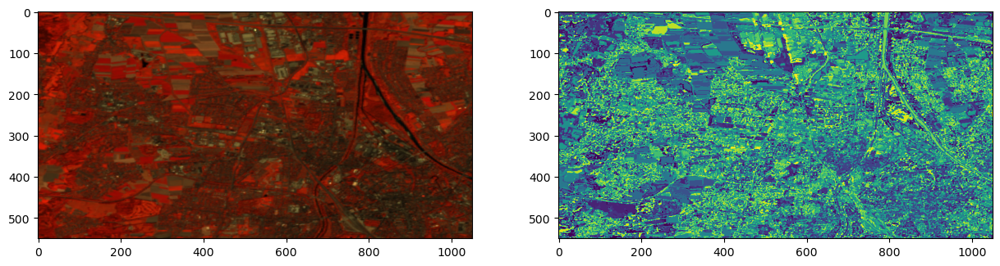

In [125]:
from sklearn.cluster import KMeans

bands, rows, cols = img.shape

k = 21 # num of clusters

kmeans_predictions = KMeans(n_clusters=k, random_state=0).fit(reshaped_img.reshape(-1, 8))

kmeans_predictions_2d = kmeans_predictions.labels_.reshape(rows, cols)

# Now show the classmap next to the image
fig, axs = plt.subplots(1,2,figsize=(15,8))

img_stretched = color_stretch(reshaped_img, [7, 3, 2]) #try different band combinations
axs[0].imshow(img_stretched)

axs[1].imshow(kmeans_predictions_2d)

## KNeighbours

In [126]:
from sklearn.neighbors import KNeighborsClassifier

# Create the KNN model
knn = KNeighborsClassifier()

# Train the model
knn.fit(X, y)

KNeighborsClassifier()

In [127]:
with rasterio.open(img_fp) as src:
    img = src.read()[:, 400:950, 450:1500]
reshaped_img = reshape_as_image(img)

# Predict the classes using the KNN model
class_prediction = knn.predict(reshaped_img.reshape(-1, 8))

# Reshape the classification map for visualization
class_prediction = str_class_to_int(class_prediction)

In [128]:
def color_stretch(image, index):
    colors = image[:, :, index].astype(np.float64)
    for b in range(colors.shape[2]):
        colors[:, :, b] = rasterio.plot.adjust_band(colors[:, :, b])
    return colors
    
# find the highest pixel value in the prediction image
n = int(np.max(class_prediction))

# next setup a colormap for our map
colors = dict((
    (0, (255, 215, 0, 255)),    # Airports - Gold
    (1, (34, 139, 34, 255)),    # Arable Land - Forest Green
    (2, (255, 69, 0, 255)),     # Construction - Orange Red
    (3, (220, 20, 60, 255)),    # Continuous Urban Fabric - Crimson
    (4, (0, 191, 255, 255)),    # Discontinuous Dense Urban Fabric - Deep Sky Blue
    (5, (148, 0, 211, 255)),    # Discontinuous Low Density Urban Fabric - Dark Violet
    (6, (255, 140, 0, 255)),    # Discontinuous Medium Density Urban Fabric - Dark Orange
    (7, (32, 178, 170, 255)),   # Discontinuous Very Low Density Urban Fabric - Light Sea Green
    (8, (128, 0, 128, 255)),    # Fast Transit Roads and Associated Land - Purple
    (9, (34, 139, 34, 255)),    # Forests - Forest Green
    (10, (107, 142, 35, 255)),  # Green Urban Areas - Olive Drab
    (11, (154, 205, 50, 255)),  # Herbaceous Vegetation Associations - Yellow Green
    (12, (178, 34, 34, 255)),   # Industrial, Commercial, Public, Military and Private Units - Firebrick
    (13, (189, 183, 107, 255)), # Isolated Structures - Dark Khaki
    (14, (0, 128, 128, 255)),   # Land without Current Use - Teal
    (15, (165, 42, 42, 255)),   # Mineral Extraction and Dump Sites - Brown
    (16, (85, 107, 47, 255)),   # Other Roads and Associated Land - Dark Olive Green
    (17, (255, 99, 71, 255)),   # Pastures - Tomato
    (18, (0, 0, 128, 255)),     # Railways and Associated Land - Navy
    (19, (72, 61, 139, 255)),   # Sports and Leisure Facilities - Dark Slate Blue
    (20, (70, 130, 180, 255)),  # Water - Steel Blue
))

# Put 0 - 255 as float 0 - 1
for k in colors:
    v = colors[k]
    _v = [_v / 255.0 for _v in v]
    colors[k] = _v
    
index_colors = [colors[key] if key in colors else 
                (255, 255, 255, 0) for key in range(0, n+1)]

cmap = plt.matplotlib.colors.ListedColormap(index_colors, 'Classification', n+1)

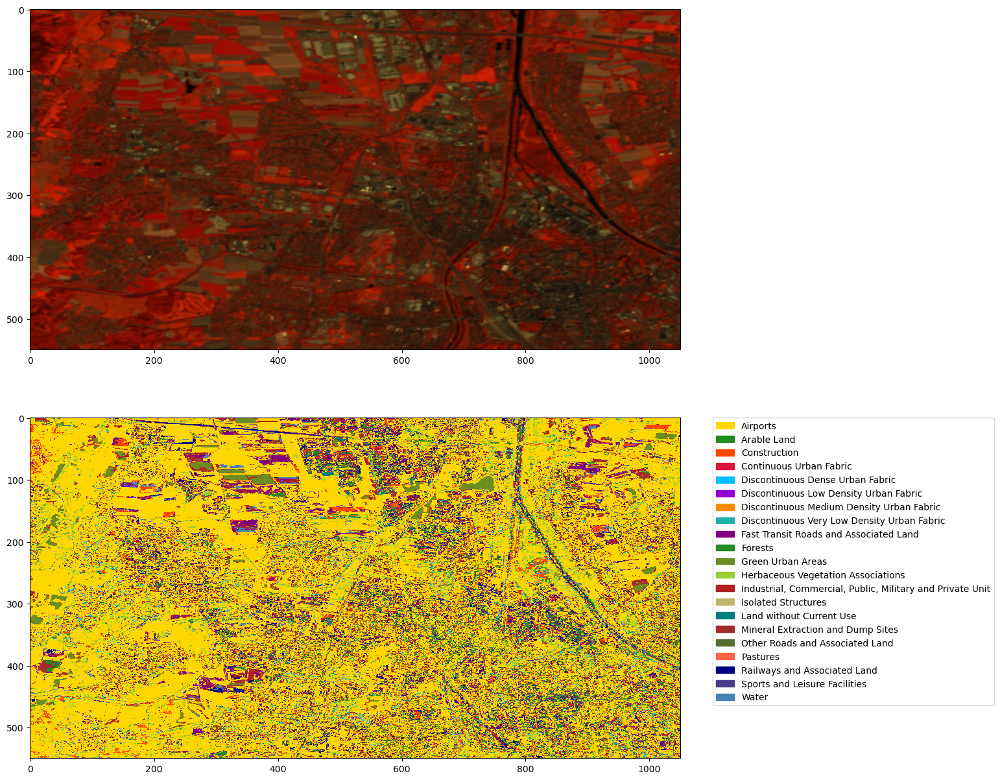

In [129]:
fig, axs = plt.subplots(2, 1, figsize=(20, 15))

img_stretched = color_stretch(reshaped_img, [7, 3, 2])
axs[0].imshow(img_stretched)

class_prediction_2d = class_prediction.reshape(reshaped_img[:, :, 0].shape)
axs[1].imshow(class_prediction_2d, cmap=cmap, interpolation='none')
axs[1].legend(handles=patches, loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

plt.show()

## Decision Tree

In [130]:
from sklearn.tree import DecisionTreeClassifier

# Create the Decision Tree model
dt = DecisionTreeClassifier()

# Train the model
dt.fit(X, y)

DecisionTreeClassifier()

In [131]:
# Read and reshape the image
with rasterio.open(img_fp) as src:
    img = src.read()[:, 400:950, 450:1500]
reshaped_img = reshape_as_image(img)

# Predict the classes using the Decision Tree model
class_prediction = dt.predict(reshaped_img.reshape(-1, 8))

# Reshape the classification map for visualization
class_prediction = str_class_to_int(class_prediction)

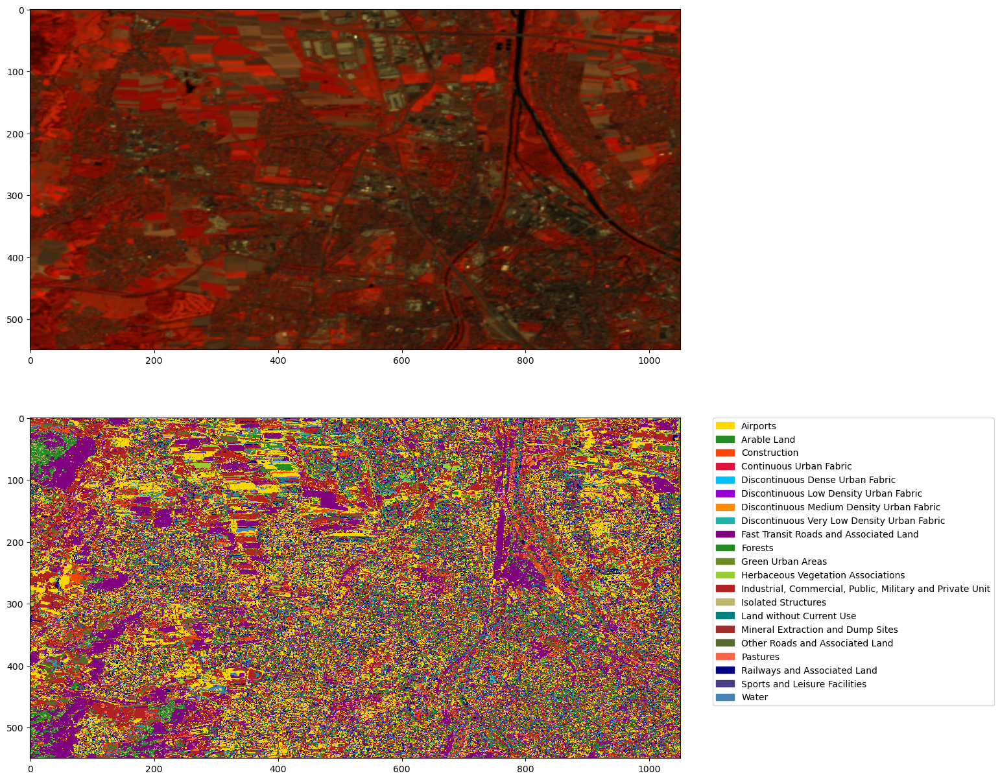

In [132]:
fig, axs = plt.subplots(2, 1, figsize=(20, 15))

img_stretched = color_stretch(reshaped_img, [7, 3, 2])
axs[0].imshow(img_stretched)

class_prediction_2d = class_prediction.reshape(reshaped_img[:, :, 0].shape)
axs[1].imshow(class_prediction_2d, cmap=cmap, interpolation='none')
axs[1].legend(handles=patches, loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

plt.show()